# Preparation for scVI and post-scVI analysis of all donors data (nuclei and cells), only T cells

After doublets removal (both by genotype and GEX)

This the version of the manifold after running scVI by `sample` and removing genes that have been filtered according to high ambient RNA in notebook **M2**

11.11.2021

What happens here:
- preparation for scVI (calculating effect of cell cycle & figuring out optimal n_latent to use in scVI)
- load preprocessed object (raw filtered counts)
- do normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- calculate neighborhood graph on the latent dimensionality reporesentation from scVI
- umap
- unbiased clustering
- save

In [8]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
import bbknn
import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [9]:
np.random.seed(0)

In [10]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
annoy               NA
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
bbknn               NA
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyte

In [11]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202111_MFI_sc_sn_new_scVI_analysis/'

## Reading the preprocessed object

Preprocessing happened in M0 notebook

In [5]:
# reading the raw filtered object from joint analysis
adata = sc.read(save_path + 'adata_raw_filtered.h5ad')

In [6]:
# reading IDs of final cells to keep after doublet exclusion (scrublet and souporcell)
nodoublet_IDs = pd.read_csv(save_path + 'selected_droplets_no_doublets_in_M1_prelim_analysis.csv', index_col=0)
nodoublet_IDs

/opt/conda/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,n_genes,sample,technology,tissue,dev_age,donor,dataset,run,number_of_individuals_multiplexed,batch,...,probabilities,barcode_sample_copy,souporcell_assignment,inter_ind_doublet,S_score,G2M_score,phase,origin_M_F,is_doublet_0.05,is_doublet_0.01
barcode_sample,,,,,,,,,,,,,,,,,,,,,
AAACGGGCATTGGCGC-1_FCA7167219,1941,FCA7167219,10X_3'_scRNA-seq,decidua_immune,13_PCW,6,Vento_Nature,NaN,1,0,...,1.000000,AAACGGGCATTGGCGC-1_FCA7167219,FCA7167219_0,0,-0.022318,-0.029351,G1,M,0,0
AAACGGGTCGCGATCG-1_FCA7167219,1246,FCA7167219,10X_3'_scRNA-seq,decidua_immune,13_PCW,6,Vento_Nature,NaN,1,0,...,1.000000,AAACGGGTCGCGATCG-1_FCA7167219,FCA7167219_0,0,0.109294,-0.048533,S,M,0,0
AAAGATGAGCAATATG-1_FCA7167219,1516,FCA7167219,10X_3'_scRNA-seq,decidua_immune,13_PCW,6,Vento_Nature,NaN,1,0,...,0.999998,AAAGATGAGCAATATG-1_FCA7167219,FCA7167219_0,0,-0.045822,-0.097222,G1,M,0,0
AAAGATGAGTTCGCGC-1_FCA7167219,2099,FCA7167219,10X_3'_scRNA-seq,decidua_immune,13_PCW,6,Vento_Nature,NaN,1,0,...,1.000000,AAAGATGAGTTCGCGC-1_FCA7167219,FCA7167219_0,0,-0.033310,-0.112754,G1,M,0,0
AAAGATGCATGTCGAT-1_FCA7167219,1636,FCA7167219,10X_3'_scRNA-seq,decidua_immune,13_PCW,6,Vento_Nature,NaN,1,0,...,1.000000,AAAGATGCATGTCGAT-1_FCA7167219,FCA7167219_0,0,0.033493,-0.107313,S,M,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGTTCGTCAAGT-1_Pla_Camb10714920,2409,Pla_Camb10714920,10X_multiome,decidua_placenta_myometrium,8-9_PCW,P13,Ashley_collection_sn,NaN,1,61,...,0.957605,TTTGTGTTCGTCAAGT-1_Pla_Camb10714920,Pla_Camb10714920_0,0,0.008248,-0.176324,S,M,0,0
TTTGTGTTCTTAGTCT-1_Pla_Camb10714920,4129,Pla_Camb10714920,10X_multiome,decidua_placenta_myometrium,8-9_PCW,P13,Ashley_collection_sn,NaN,1,61,...,1.000000,TTTGTGTTCTTAGTCT-1_Pla_Camb10714920,Pla_Camb10714920_1,0,-0.073279,-0.153125,G1,F,0,0
TTTGTTGGTCACAGCG-1_Pla_Camb10714920,3116,Pla_Camb10714920,10X_multiome,decidua_placenta_myometrium,8-9_PCW,P13,Ashley_collection_sn,NaN,1,61,...,0.989358,TTTGTTGGTCACAGCG-1_Pla_Camb10714920,Pla_Camb10714920_1,0,-0.010057,-0.110007,G1,F,0,0


In [7]:
# subsetting the adata object to final cells
adata = adata[list(nodoublet_IDs.index), :].copy()
adata

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


AnnData object with n_obs × n_vars = 378558 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 'gene_ids-16', 'feature_types-16', 'genome-16', 'n_cells-16', 'gene_ids-17', 'feature_types-17', 'genome-17', 'n_cells-17', 'gene_ids-18', 'feature_types-18', 'genome-18', 'n_cells-18', 'gene_ids-19', 'feature_types-1

In [8]:
# adding metadata
for col in nodoublet_IDs.columns:
    print(col)
    adata.obs[col] = nodoublet_IDs.loc[adata.obs_names,col]

n_genes
sample
technology
tissue
dev_age
donor
dataset
run
number_of_individuals_multiplexed
batch
percent_mito
n_counts
scrublet_score
scrublet_cluster_score
bh_pval
is_doublet
celltype_predictions
probabilities
barcode_sample_copy
souporcell_assignment
inter_ind_doublet
S_score
G2M_score
phase
origin_M_F
is_doublet_0.05
is_doublet_0.01


In [9]:
np.unique(adata.obs['sample'])

array(['FCA7167219', 'FCA7167221', 'FCA7167222', 'FCA7167223',
       'FCA7167224', 'FCA7167226', 'FCA7167230', 'FCA7167231',
       'FCA7167232', 'FCA7196218', 'FCA7196219', 'FCA7196220',
       'FCA7196224', 'FCA7196225', 'FCA7196226', 'FCA7196229',
       'FCA7196231', 'FCA7474062', 'FCA7474063', 'FCA7474064',
       'FCA7474065', 'FCA7474066', 'FCA7474068', 'FCA7474069',
       'FCA7511881', 'FCA7511882', 'FCA7511883', 'FCA7511884',
       'FCA7511885', 'FCA7511886', 'Pla_Camb10691970', 'Pla_Camb10691971',
       'Pla_Camb10691972', 'Pla_Camb10691975', 'Pla_Camb10714918',
       'Pla_Camb10714919', 'Pla_Camb10714920', 'Pla_HDBR10142767',
       'Pla_HDBR10142768', 'Pla_HDBR10142769', 'Pla_HDBR10142770',
       'Pla_HDBR10142863', 'Pla_HDBR10142864', 'Pla_HDBR10142865',
       'Pla_HDBR10701666', 'Pla_HDBR10701667', 'Pla_HDBR10701668',
       'Pla_HDBR10917730', 'Pla_HDBR10917731', 'Pla_HDBR10917733',
       'Pla_HDBR8624430', 'Pla_HDBR8624431', 'Pla_HDBR8715512',
       'Pla_HDBR87

In [10]:
# quick check to see if raw is raw or not
expr_mtx_dense = adata[adata.obs['sample'] == 'Pla_Camb10691970'].X.todense()

In [11]:
# YAS we all good
np.unique(expr_mtx_dense)

matrix([[   0.,    0.,    0., ..., 4162., 4637., 6366.]], dtype=float32)

In [12]:
# subsetting to only trophoblast according to coarse annotation done in notebook M4
annot_coarse = pd.read_csv(save_path + 'obs_table_with_coarse_annot_from_M4_notebook_all_cell_states.csv',
                          index_col=0)
adata.obs['annot_coarse'] = annot_coarse.loc[adata.obs_names,'annot_coarse']
adata.obs['annot_coarse'].value_counts()

/opt/conda/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (6,28) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


dS_uSMC        158106
Trophoblast     81704
Myeloid         43997
NK              30132
T               19244
Epithelial      18222
Endothelial     12689
fF              12633
PV               1831
Name: annot_coarse, dtype: int64

In [13]:
adata

AnnData object with n_obs × n_vars = 378558 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'celltype_predictions', 'probabilities', 'barcode_sample_copy', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'origin_M_F', 'is_doublet_0.05', 'is_doublet_0.01', 'annot_coarse'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 'gene_

In [14]:
adata = adata[adata.obs['annot_coarse'] == 'T'].copy()
adata

AnnData object with n_obs × n_vars = 19244 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'celltype_predictions', 'probabilities', 'barcode_sample_copy', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'origin_M_F', 'is_doublet_0.05', 'is_doublet_0.01', 'annot_coarse'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 'gene_i

________

# Preparation for scVI: 

1) Calculating cell cycle-associated genes (to later be excluded in scVI analysis)
2) Calculating a minimum extimate of number of latent variables to use in scVI analysis later (when doing batch correction) as the number of PCs optimally explaining this data

Let's see if cell cycle has an effect in trophoblast and remember them to exclude in scVI calculation

In [15]:
adata_copy = adata.copy()

In [16]:
# normalise and log transform
sc.pp.normalize_per_cell(adata_copy, counts_per_cell_after=1e4)
sc.pp.log1p(adata_copy)

# saving normalised and log transformed values into the raw attribute to later be able to plot
adata_copy.raw = adata_copy.copy()

adata_copy.var_names_make_unique()
adata_copy.obs_names_make_unique()

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [17]:
# excluding soupy genes as per notebook M2

# gene stats for cells
gene_stats_sc = pd.read_csv(save_path + 'gene_filter_cells_upd_20211111.csv', index_col=0)

# gene stats for nuclei
gene_stats_sn = pd.read_csv(save_path + 'gene_filter_nuclei_upd_20211111.csv', index_col=0)

genes2keep_sc = list(gene_stats_sc[gene_stats_sc['Selected'] == True].index)
genes2keep_sn = list(gene_stats_sn[gene_stats_sn['Selected'] == True].index)

# overlap
genes2keep = list(set(genes2keep_sc) & set(genes2keep_sn))

len(genes2keep)

7849

In [18]:
#adata_copy = adata_copy[:,list(set(genes2keep) & set(adata_copy.var_names))].copy()
adata_copy

AnnData object with n_obs × n_vars = 19244 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'celltype_predictions', 'probabilities', 'barcode_sample_copy', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'origin_M_F', 'is_doublet_0.05', 'is_doublet_0.01', 'annot_coarse'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 'gene_i

_____________________________________________________________________________________________________________________________________________________________

### Filter Cell cycle genes 
Per genes analysis: identify genes behaving like known cell cycle genes

extracting highly variable genes
    finished (0:00:00)


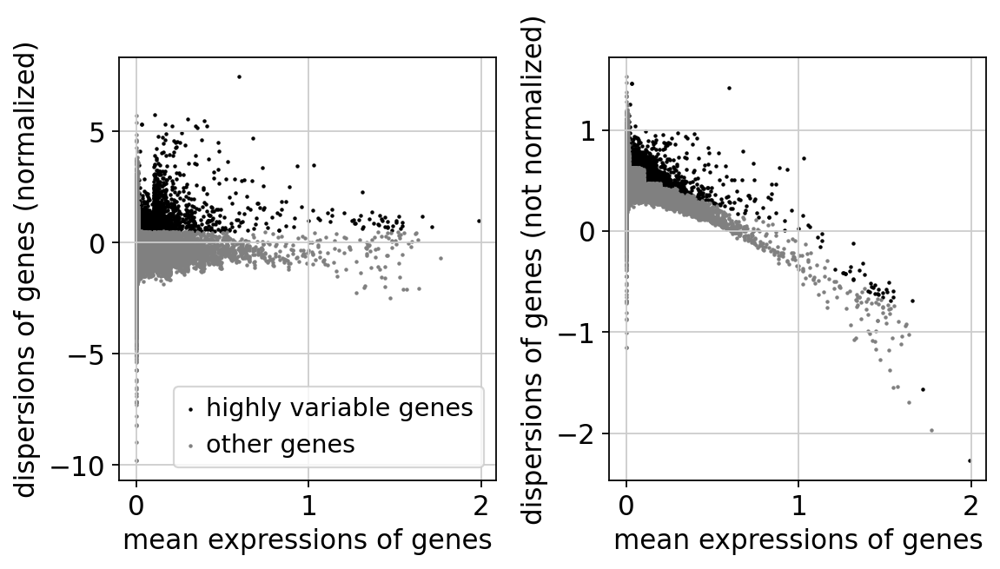

In [19]:
cellcycle_adata = adata_copy.copy()
# Extract highly variable genes
filter_result = sc.pp.filter_genes_dispersion(
    cellcycle_adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.filter_genes_dispersion(filter_result,save='_ccg_identification.pdf')

In [20]:
# Traspose matrix for a GENE-centered analysis
cellcycle_adata = cellcycle_adata.T
cellcycle_adata = cellcycle_adata[filter_result.gene_subset,:]


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [21]:
# Scale data to unit variance and zero mean
sc.pp.scale(cellcycle_adata, max_value=10)
# PCA
sc.tl.pca(cellcycle_adata, svd_solver='arpack')

/opt/conda/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:810: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:02)


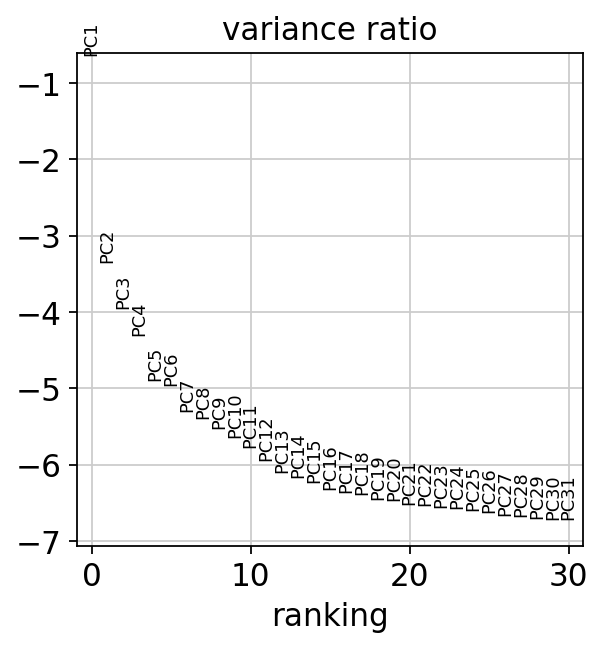

In [22]:
# Plot the variance ratio
sc.pl.pca_variance_ratio(cellcycle_adata, log=True, save='_ccg_identification.pdf')

computing neighbors
    using 'X_pca' with n_pcs = 7
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
... storing 'sample' as categorical
... storing 'technology' as categorical
... storing 'tissue' as categorical
... storing 'dev_age' as categorical
... storing 'donor' as categorical
... storing 'dataset' as categorical
... storing 'celltype_predictions' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'phase' as categorical
... storing 'origin_M_F' as categorical
... storing 'annot_coarse' as categorical


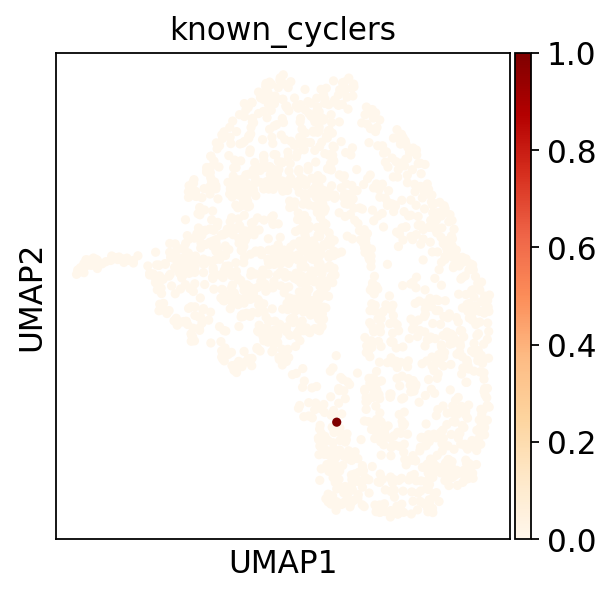

In [23]:
# Identify genes behaving like cc genes
num_pcs = 7
# Compute a neighborhood graph of observations
sc.pp.neighbors(cellcycle_adata,n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(cellcycle_adata)
cellcycle_adata.obs['known_cyclers'] = [1 if gene in ['CDK1','MKI67','CCNB2','PCNA'] else 0 for gene in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers'],color_map='OrRd',save='_ccg_identification.pdf')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


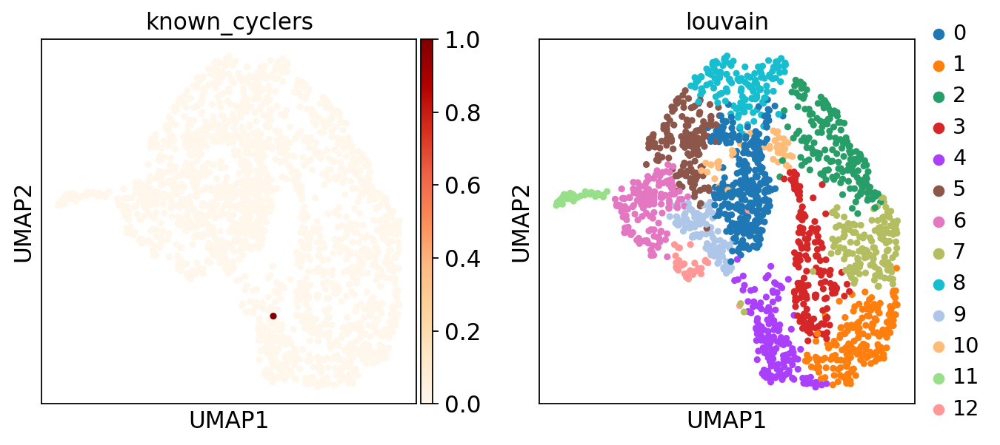

In [24]:
# Cluster GENES into subgroups using louvain
sc.tl.louvain(cellcycle_adata, resolution=1.0)
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers',
                                  'louvain'],color_map='OrRd',save='_ccg_identification.pdf')

In [25]:
for gene in ['CDK1','MKI67','CCNB2','PCNA']:
    print(gene, 'in current features:', gene in cellcycle_adata.obs_names)

CDK1 in current features: False
MKI67 in current features: True
CCNB2 in current features: False
PCNA in current features: False


In [27]:
# Locate genes of interests' cluster
print(cellcycle_adata.obs.loc[[#'CDK1',
                                'MKI67',
                               #'CCNB2','PCNA',
                              ],'louvain'])


MKI67    4
Name: louvain, dtype: category
Categories (13, object): ['0', '1', '2', '3', ..., '9', '10', '11', '12']


In [28]:
cellcycle_adata.obs['louvain'].value_counts()

0     289
1     184
2     166
3     165
4     157
5     157
6     148
7     143
8     135
9      99
10     45
11     40
12     30
Name: louvain, dtype: int64

In [29]:
adata

AnnData object with n_obs × n_vars = 19244 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'celltype_predictions', 'probabilities', 'barcode_sample_copy', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'origin_M_F', 'is_doublet_0.05', 'is_doublet_0.01', 'annot_coarse'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 'gene_i

So removing cluster 4 genes here

In [30]:
# Add unstructured dict-like annotation for ccgs
adata_copy.uns['ccgs'] = list(cellcycle_adata.obs[(cellcycle_adata.obs['louvain']=='4')].index)
# Remove cc genes
adata_copy = adata_copy[:,[i not in adata_copy.uns['ccgs'] for i in adata_copy.var_names]]


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [31]:
adata_copy

View of AnnData object with n_obs × n_vars = 19244 × 30643
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'celltype_predictions', 'probabilities', 'barcode_sample_copy', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'origin_M_F', 'is_doublet_0.05', 'is_doublet_0.01', 'annot_coarse'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15',

In [34]:
# save this table to use in scVI analysis
adata_copy.var.to_csv(save_path + 'cleaned_up_genes_in_S4_notebook_T_20211114.csv')

# Subsetting to HVGs & scaling

In [35]:
%%time
sc.pp.highly_variable_genes(adata_copy, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:02)
Trying to set attribute `.uns` of view, copying.
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


CPU times: user 2.39 s, sys: 189 ms, total: 2.58 s
Wall time: 2.58 s


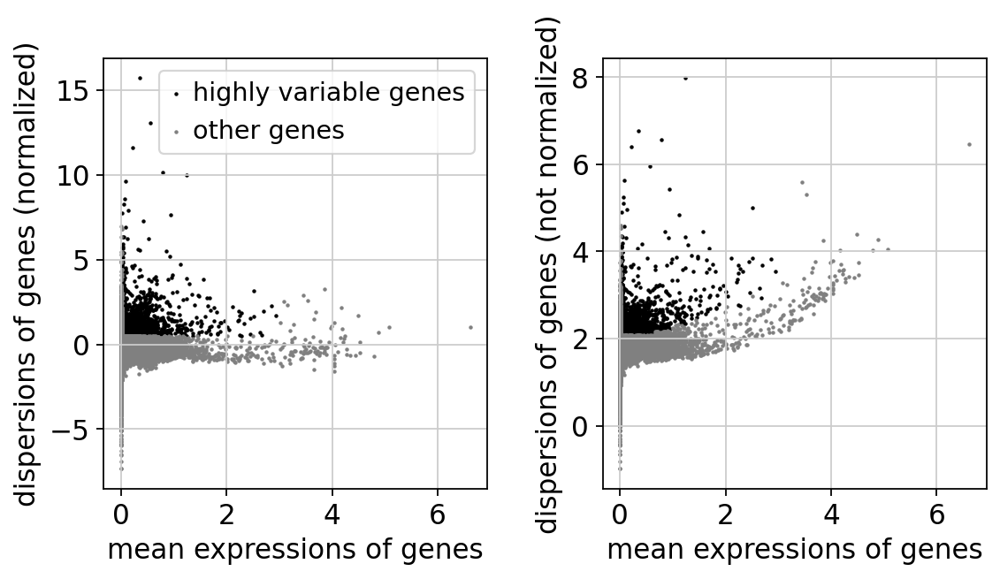

CPU times: user 523 ms, sys: 6.46 ms, total: 529 ms
Wall time: 527 ms


In [36]:
%%time
sc.pl.highly_variable_genes(adata_copy)

In [37]:
adata_copy_hvg = adata_copy[:, adata_copy.var['highly_variable']]

In [38]:
adata_copy_hvg

View of AnnData object with n_obs × n_vars = 19244 × 3326
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'celltype_predictions', 'probabilities', 'barcode_sample_copy', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'origin_M_F', 'is_doublet_0.05', 'is_doublet_0.01', 'annot_coarse'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 

In [39]:
%%time
sc.pp.scale(adata_copy_hvg, max_value=10)

/opt/conda/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:810: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


CPU times: user 950 ms, sys: 344 ms, total: 1.29 s
Wall time: 1.29 s


________

### PCA

In [40]:
%%time
sc.tl.pca(adata_copy_hvg, svd_solver='arpack', n_comps=50)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:09)


CPU times: user 1min 4s, sys: 12 s, total: 1min 16s
Wall time: 9.58 s


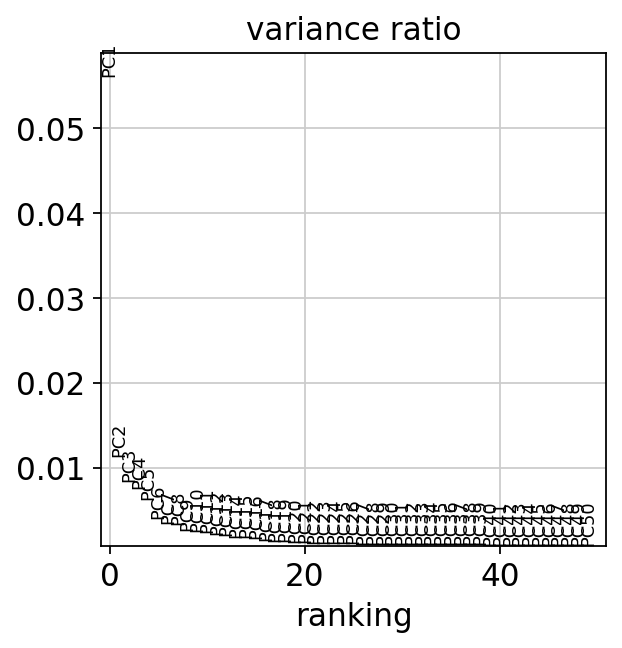

In [41]:
sc.pl.pca_variance_ratio(adata_copy_hvg, n_pcs=50)

In [43]:
# decision: using n_latent = 9 in scVI

From here following to run scVI in: `/nfs/team292/aa22/scVI_related/202111_upd_in_vivo_analysis/all_donors_analysis/scVI_integration.ipynb`

________

Carrying on to 
- Normalise and log transform
- Save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- Make cell names (obs) and gene names (var) unique

In [44]:
# normalise and log transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

# saving normalised and log transformed values into the raw attribute to later be able to plot
adata.raw = adata.copy()

adata.var_names_make_unique()
adata.obs_names_make_unique()

normalizing by total count per cell
/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


_____________________________________________________________________________________________________________________________________________________________

In [45]:
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    503 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    502 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


In [46]:
adata

AnnData object with n_obs × n_vars = 19244 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'celltype_predictions', 'probabilities', 'barcode_sample_copy', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'origin_M_F', 'is_doublet_0.05', 'is_doublet_0.01', 'annot_coarse'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 'gene_i

_______________________________________________________________________________________________________

# Read in scVI-calculated latent representation

In [47]:
# in this case we only used 16 PCs, but also experimented with the layers
n_latent = [9]
n_layers = [3]

### 14.11.2021 run, correction by `sample`

In [48]:
latent_representations = {}

for n_layers_value in n_layers:
    print(n_layers_value)
    
    curr_path = '/nfs/team292/aa22/scVI_related/202111_upd_in_vivo_analysis/all_donors_analysis/results/20211114_obsm_with_scVI_latent_representation_n_9_after_all_doublet_exclusion_by_sample_T_compartment_with_LF_gene_filter_n_layers_' + str(n_layers_value) + '.csv' 
         
    latent_representations[n_layers_value] = pd.read_csv(curr_path, index_col=0)

3


In [49]:
# assign these latent_representations into adata.obsm
for n_layers_value in n_layers:
    print(n_layers_value)
    adata.obsm['X_scVI_n_latent_9_sample_n_layers_' + str(n_layers_value)] = np.array(latent_representations[n_layers_value])

3


In [50]:
adata.obsm['X_scVI_n_latent_9_sample_n_layers_3'].shape

(19244, 9)

__________________________________________________________________________________________________________________________________________________________________

### Neighbourhood graph & UMAP

In [51]:
%%time

for n_layers_value in n_layers:
    print(n_layers_value)
    sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_scVI_n_latent_9_sample_n_layers_' + str(n_layers_value),
               key_added='neighbors_scVI_n_latent_9_sample_n_layers_' + str(n_layers_value))

computing neighbors


3


    finished: added to `.uns['neighbors_scVI_n_latent_9_sample_n_layers_3']`
    `.obsp['neighbors_scVI_n_latent_9_sample_n_layers_3_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_scVI_n_latent_9_sample_n_layers_3_connectivities']`, weighted adjacency matrix (0:00:14)


CPU times: user 15.6 s, sys: 6.21 s, total: 21.8 s
Wall time: 14.1 s


In [52]:
adata

AnnData object with n_obs × n_vars = 19244 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'celltype_predictions', 'probabilities', 'barcode_sample_copy', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'origin_M_F', 'is_doublet_0.05', 'is_doublet_0.01', 'annot_coarse'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 'gene_i

__________________________________________________________________________________________________________________________________________________________________

In [53]:
%%time
# takes a few minutes
for n_layers_value in n_layers:
    print(n_layers_value)
    
    sc.tl.umap(adata, random_state=0,
              neighbors_key='neighbors_scVI_n_latent_9_sample_n_layers_' + str(n_layers_value))
    # copy current adata.obsm['X_umap'] into adata.obsm['X_umap_scVI_n_latent_' + str(n_latent_value)]
    adata.obsm['X_umap_scVI_n_latent_9_sample_n_layers_' + str(n_layers_value)] = adata.obsm['X_umap']
    
    

computing UMAP


3


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


CPU times: user 7.74 s, sys: 2.27 s, total: 10 s
Wall time: 5.88 s


In [54]:
np.unique(adata.obs['sample'], return_counts=True)

(array(['FCA7167219', 'FCA7167221', 'FCA7167222', 'FCA7167223',
        'FCA7167224', 'FCA7167226', 'FCA7167230', 'FCA7167231',
        'FCA7167232', 'FCA7196218', 'FCA7196219', 'FCA7196220',
        'FCA7196224', 'FCA7196225', 'FCA7196226', 'FCA7196229',
        'FCA7196231', 'FCA7474062', 'FCA7474064', 'FCA7474065',
        'FCA7474068', 'FCA7511881', 'FCA7511882', 'FCA7511884',
        'FCA7511885', 'FCA7511886', 'Pla_Camb10691970', 'Pla_Camb10691971',
        'Pla_Camb10691972', 'Pla_Camb10691975', 'Pla_Camb10714918',
        'Pla_Camb10714919', 'Pla_Camb10714920', 'Pla_HDBR10142767',
        'Pla_HDBR10142768', 'Pla_HDBR10142769', 'Pla_HDBR10142770',
        'Pla_HDBR10142863', 'Pla_HDBR10142864', 'Pla_HDBR10142865',
        'Pla_HDBR10701666', 'Pla_HDBR10701667', 'Pla_HDBR10701668',
        'Pla_HDBR10917730', 'Pla_HDBR10917731', 'Pla_HDBR10917733',
        'Pla_HDBR8624430', 'Pla_HDBR8624431', 'Pla_HDBR8715512',
        'Pla_HDBR8715514', 'Pla_HDBR8768477', 'WSSS_PLA8764121',
  

In [55]:
adata

AnnData object with n_obs × n_vars = 19244 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'celltype_predictions', 'probabilities', 'barcode_sample_copy', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'origin_M_F', 'is_doublet_0.05', 'is_doublet_0.01', 'annot_coarse'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 'gene_i

## Saving this object with all the manifolds calculated

In [56]:
adata.write(save_path + 'adata_scVI_analysed_corr_by_sample_T_with_LF_gene_filter.h5ad')



... storing 'sample' as categorical
... storing 'technology' as categorical
... storing 'tissue' as categorical
... storing 'dev_age' as categorical
... storing 'donor' as categorical
... storing 'dataset' as categorical
... storing 'celltype_predictions' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'phase' as categorical
... storing 'origin_M_F' as categorical
... storing 'annot_coarse' as categorical


In [12]:
# reading the previously saved file
adata = sc.read(save_path + 'adata_scVI_analysed_corr_by_sample_T_with_LF_gene_filter.h5ad')


In [57]:
# to better distinguish predictions from Vento-Tormo dataset
colors_VT = ['#C1B4A7','#E8D6E0','#40ab5d','#F4BF73','#F7B5A4',
                 '#d8e7a4','#2ECCFA','#39728C','#FA5858','#E9A1C7',
                 '#B40486','#004529','#C49A6C','#9255a0', '#58595B', '#A3A8AD',
                 '#F6D8CE','#633A6D','#C7E0BD','#49ABC8', '#E7C949', '#F7F297', '#af9e56',
                 '#ED1B64','#E59C24','#C2E8F6','#677EB2','#73FDD6', '#BC3122', '#771A15',
                 '#E6C6F7','#CEE3F6','#CECEF6','#677EB2','#6363A5','#63A585',
                 '#246D66','#9B8579']

### scVI-corrected by `sample`

n_latent = 9, n_layers = 3

In [13]:
curr_embedding_key = 'X_umap_scVI_n_latent_9_sample_n_layers_3'

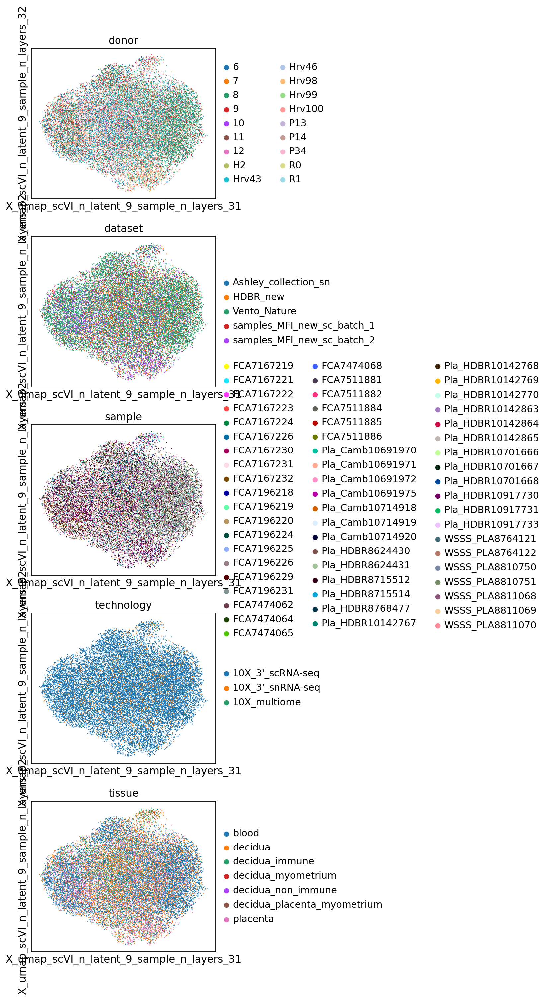

In [59]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['donor','dataset','sample','technology','tissue'], ncols=1)

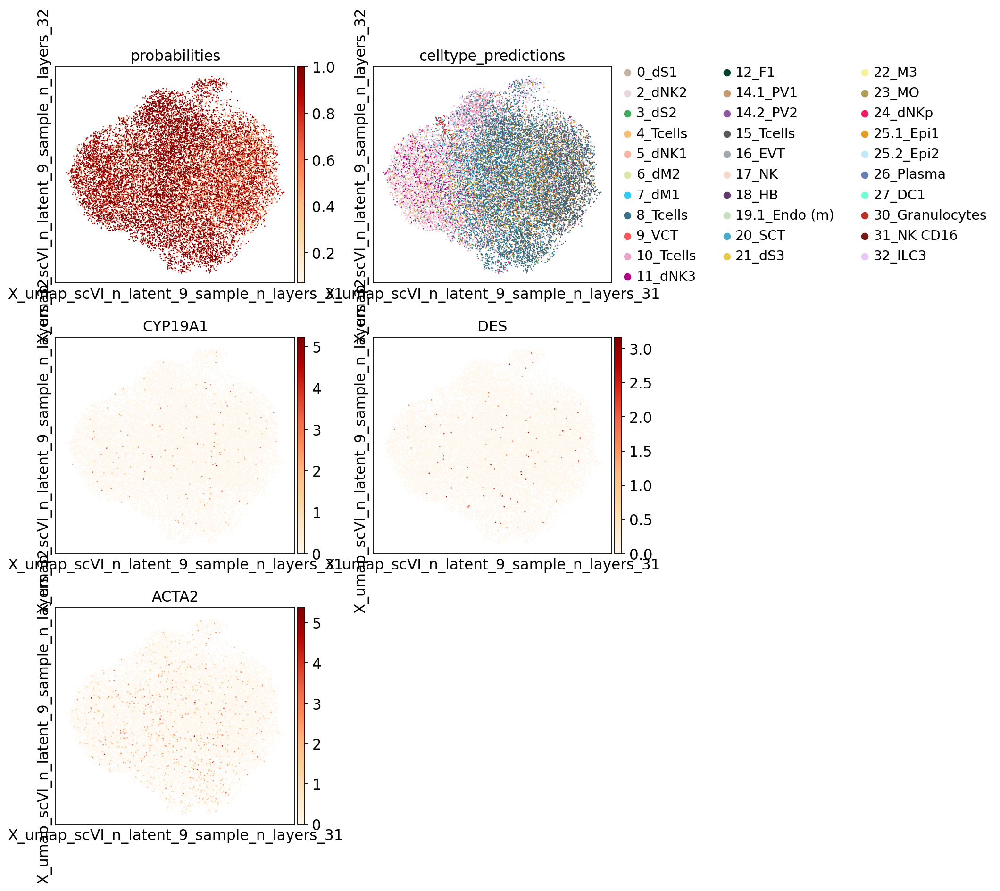

In [60]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['probabilities','celltype_predictions','CYP19A1',
                       'DES',
                      'ACTA2'], cmap='OrRd', ncols=2,
               palette=colors_VT)

In [69]:
for gene in adata.var_names:
    if 'CD8' in gene:
        print(gene)


CD80
CD81
CD81-AS1
CD82
CD83
CD84
CD86
CD8A
CD8B
CD8B2


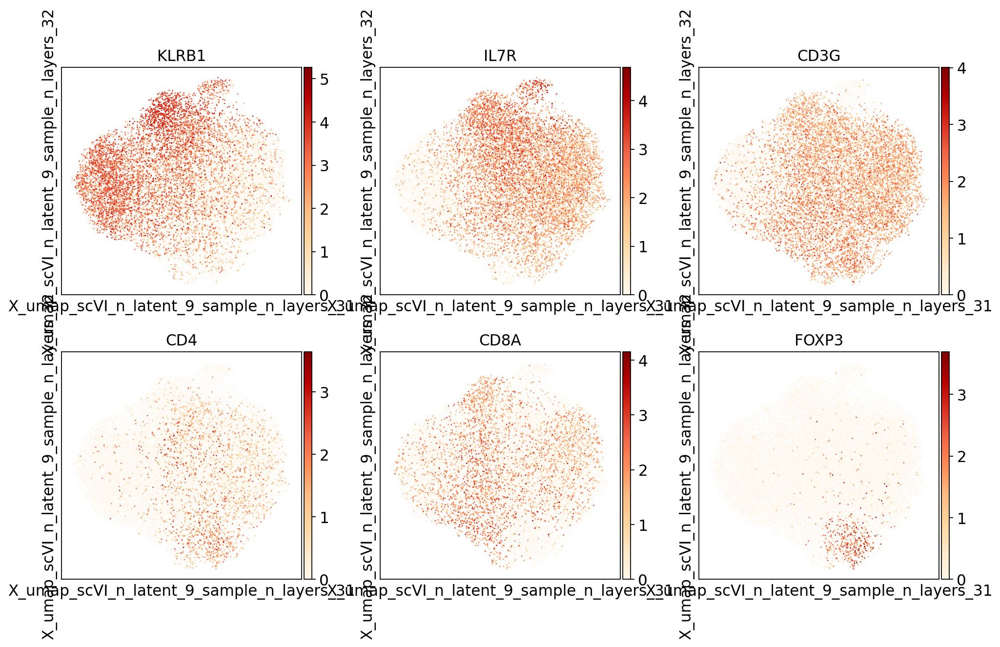

In [7]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['KLRB1', # high in MAIT/GD T cells
                       'IL7R', # ILC3, some CD4 and CD8 T cells
                       'CD3G','CD4','CD8A','FOXP3',
                      ], ncols=3, use_raw=True, cmap='OrRd')

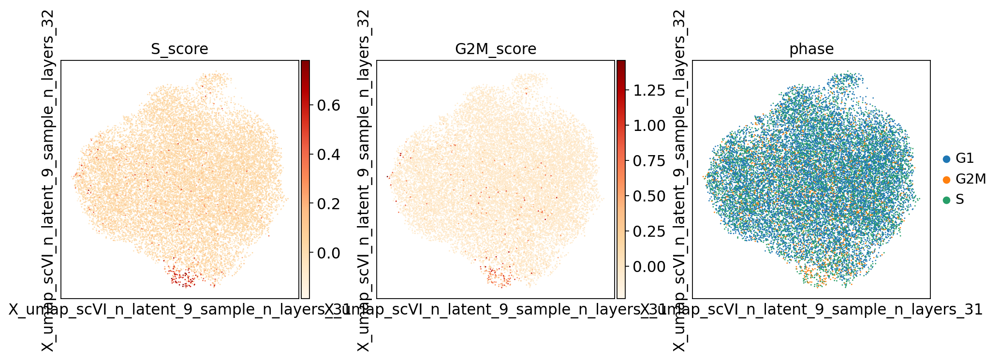

In [71]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['S_score','G2M_score','phase'], cmap='OrRd')

In [72]:
adata

AnnData object with n_obs × n_vars = 19244 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'celltype_predictions', 'probabilities', 'barcode_sample_copy', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'origin_M_F', 'is_doublet_0.05', 'is_doublet_0.01', 'annot_coarse'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 'gene_i

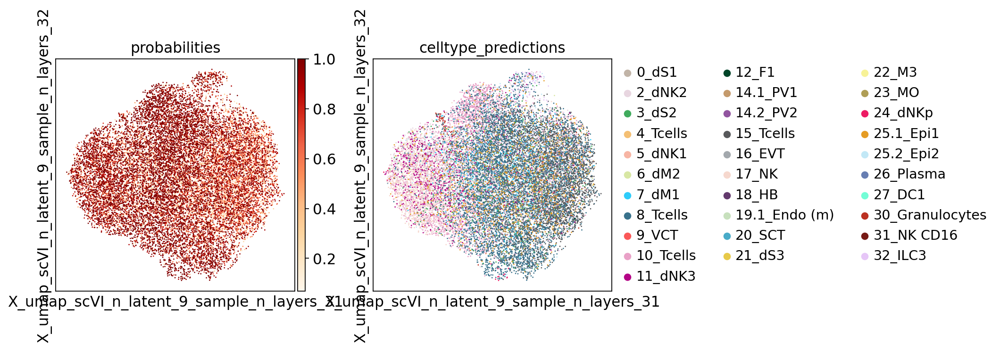

In [73]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['probabilities','celltype_predictions'], cmap='OrRd', ncols=2,
               palette=colors_VT)

In [74]:
adata

AnnData object with n_obs × n_vars = 19244 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'celltype_predictions', 'probabilities', 'barcode_sample_copy', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'origin_M_F', 'is_doublet_0.05', 'is_doublet_0.01', 'annot_coarse'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 'gene_i

### Let's cluster the data in the version of the object with n_layers = 3 and label contaminants / doublet clusters


In [14]:
sc.tl.louvain(adata, resolution=0.8,
             neighbors_key = 'neighbors_scVI_n_latent_9_sample_n_layers_3',
             key_added = 'louvain_scVI_n_latent_9_sample_n_layers_3')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain_scVI_n_latent_9_sample_n_layers_3', the cluster labels (adata.obs, categorical) (0:00:01)


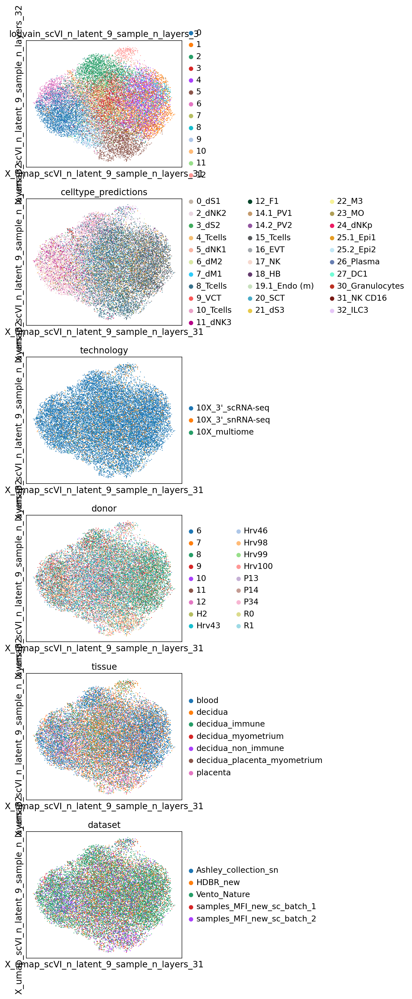

In [91]:
sc.pl.embedding(adata, curr_embedding_key, color=['louvain_scVI_n_latent_9_sample_n_layers_3',
                                                 'celltype_predictions','technology','donor', 'tissue','dataset'],
               ncols=1
               )

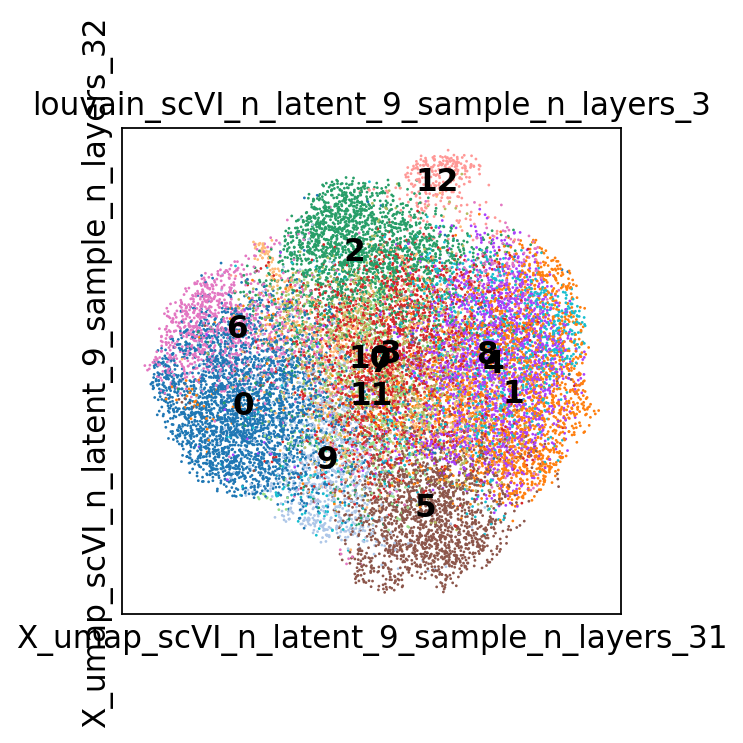

In [79]:
sc.pl.embedding(adata, curr_embedding_key, color=['louvain_scVI_n_latent_9_sample_n_layers_3',
                                                 #'celltype_predictions','annotations_P13_troph','donor','technology'
                                                 ], legend_loc='on data',
               ncols=1
               )

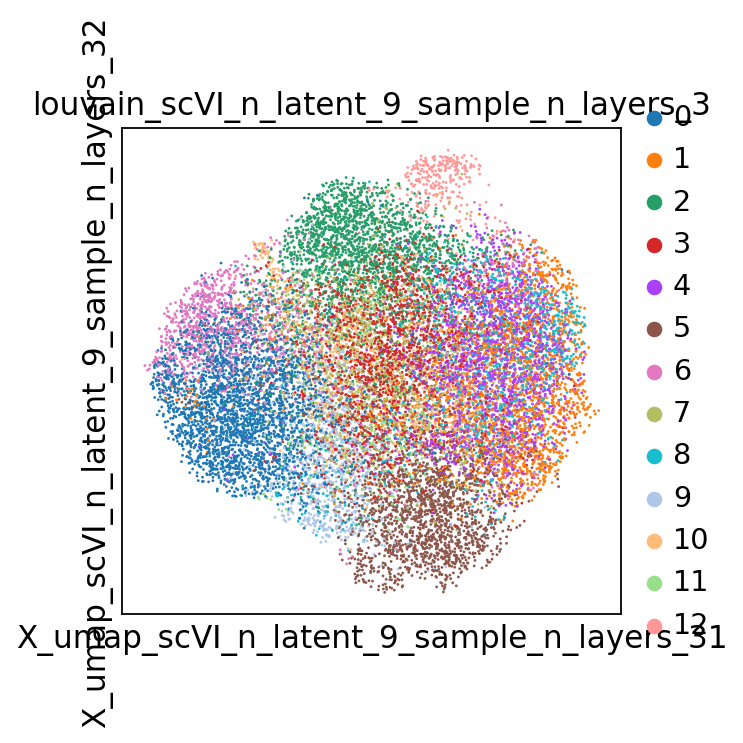

In [80]:
sc.pl.embedding(adata, curr_embedding_key, color=['louvain_scVI_n_latent_9_sample_n_layers_3',
                                                 #'celltype_predictions','annotations_P13_troph','donor','technology'
                                                 ], #legend_loc='on data',
               ncols=1
               )

# DE

In [81]:
adata_raw = sc.read(save_path + 'adata_raw_filtered.h5ad')

In [82]:
adata_raw.X.shape

(430136, 30800)

In [83]:
adata_raw = adata_raw[adata.obs_names,:].copy()

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [84]:
adata_raw.obs['louvain'] = adata.obs['louvain_scVI_n_latent_9_sample_n_layers_3']

In [85]:
%%time
# quick DE
sc.tl.rank_genes_groups(adata_raw, groupby='louvain', n_genes=1000, method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:45)


CPU times: user 35.1 s, sys: 10.2 s, total: 45.3 s
Wall time: 45.3 s


In [86]:
adata.uns['rank_genes_groups'] = adata_raw.uns['rank_genes_groups']

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:39)
Storing dendrogram info using `.uns['dendrogram_louvain_scVI_n_latent_9_sample_n_layers_3']`


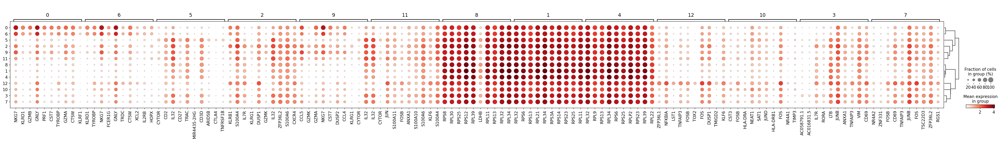

In [89]:
# Plot with gene expression normalized and log transformed values
sc.pl.rank_genes_groups_dotplot(adata,
                                groupby='louvain_scVI_n_latent_9_sample_n_layers_3',
                                #groups = ['1'],
                                n_genes=10, dendrogram=True)

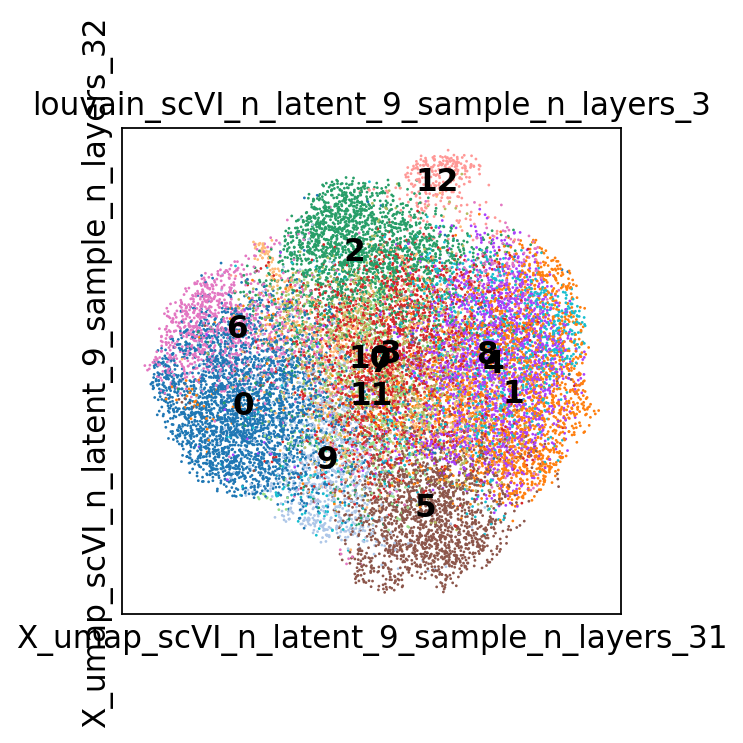

In [90]:
sc.pl.embedding(adata, curr_embedding_key, color=['louvain_scVI_n_latent_9_sample_n_layers_3',
                                                 #'celltype_predictions','annotations_P13_troph','donor','technology'
                                                 ], legend_loc='on data',
               ncols=1
               )

In [16]:
# 12 - ILC3
# 0,6,9 - NK (coming from blood)
# 2 - T_cells (coming from blood)
# 1,3,4,7,8,10,11 - dT_cells
# 5 - dT_regs

In [17]:
def annot_T(adata_obj, barcode_sample):
    curr_clus = adata.obs.loc[barcode_sample,'louvain_scVI_n_latent_9_sample_n_layers_3']
    
    # 12 - ILC3
    # 0,6,9 - NK (coming from blood)
    # 2 - T_cells (coming from blood)
    # 1,3,4,7,8,10,11 - dT_cells
    # 5 - dT_regs
    
    if curr_clus == '12':
        return('ILC3')
    elif curr_clus in ['0','6','9']:
        return('NK')
    elif curr_clus  == '2':
        return('T_cells')
    elif curr_clus in ['1','3','4','7','8','10','11']:
        return('dT_cells')
    elif curr_clus == '5':
        return('dT_regs')
    
    else:
        return('none')
    

In [18]:
# mark contaminants here
adata.obs['annot_T'] = adata.obs['barcode_sample_copy'].apply(lambda x: annot_T(adata,x))

... storing 'annot_T' as categorical


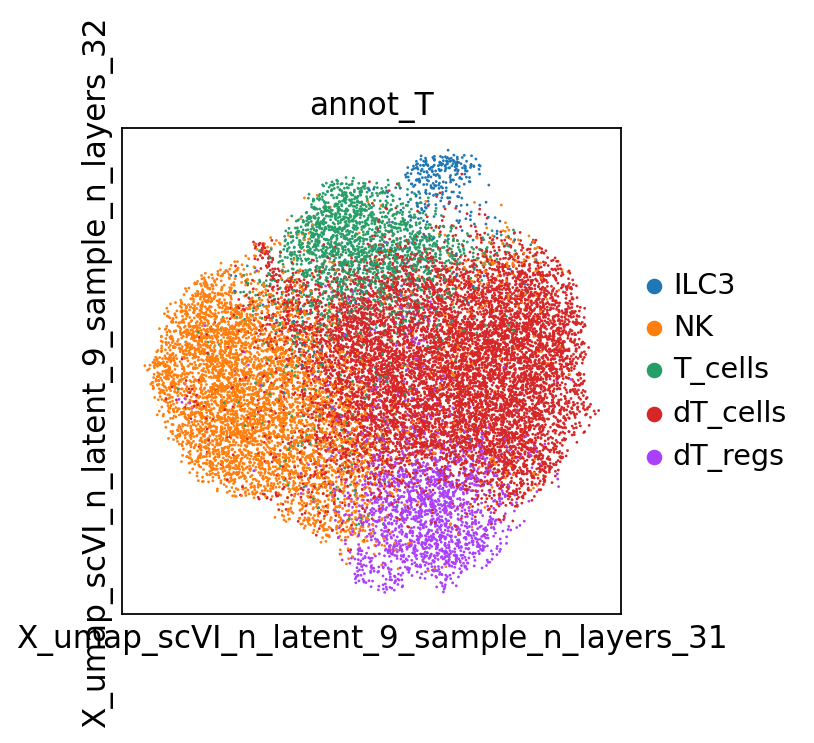

In [19]:
sc.pl.embedding(adata, curr_embedding_key, color=['annot_T',
                                                 #'celltype_predictions','annotations_P13_troph','donor','technology'
                                                 ], #legend_loc='on data',
               ncols=1
               )

In [20]:
adata.obs.to_csv(save_path + 'annot_T.csv')

In [56]:
# save coarse annotation to use for data subsetting
#adata.obs.to_csv(save_path + 'obs_table_with_coarse_annot_from_M4_notebook_all_cell_states.csv')